<a href="https://colab.research.google.com/github/jmestanza/computer-vision-2/blob/main/tp_vpc2_that_worked_9e476a55.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trabajo práctico integrador de Visión por Computadora 2
Autor: Joaquín Mestanza

N° SIU: a1726

## Problema a resolver

Detección de vehículos con imágenes en plano cenital

## Contexto y restricciones

Las imágenes son tomadas por un drone desde un plano cenital.

Las imágenes son RGB y son de alta resolución (3024x4032 pixeles, height x width).

No siempre hay vehículos ni personas en las instalaciones, de hecho es algo poco frecuente.

## Datasets candidatos

- [Dataset 1] https://universe.roboflow.com/wictronix-ubfrb/atlanz_wx-wthzi

- [Dataset 2] https://universe.roboflow.com/sardar-vallabhbhai-national-institute-if-technology/vehicle-detection-wagr7

- [Dataset 3] https://universe.roboflow.com/roy15957-gmail-com/object-detection-from-drone

Se tuvo en cuenta como primer filtro para la elección de datasets, que tengan al menos 1000 imágenes.
Los 3 dataset incluyen detección de autos, pero el tercero incluye personas también.

## Proceso

Antes de entrenar, debemos tener en cuenta con qué vamos a evaluar.
De ahí salen las siguientes preguntas:

### Entrenamiento
- Vamos a entrenar (train+validation) con
  - Los datasets de roboflow? (3.7k y 1.5k imágenes etiquetadas)

  o
  - Un dataset armado por nosotros? (que implica un etiquetado previo... 1000 imágenes al menos?)
### Testing
- Vamos a evaluar con (test)
  - Los datasets de roboflow? (al menos 100 imágenes)

  y / o
  - Un dataset armado por nosotros? (implica un subset etiquetado, al menos de 100 imágenes)

Algo a tener en cuenta es que cuando probemos con las imágenes en las inspecciones, el terreno es bastante distinto al de las imágenes de roboflow, por lo cual es posible que haya un decaimiento en la performance.
### Métricas a utilizar

La métrica a utilizar es la mAP (mean average precision).

Esta métrica depende de:
- La confianza p de que existe un objeto sea mayor a cierto umbral (> 80%, por ejemplo).
- Que la clase predicha sea la correcta
- Que la IoU del bounding box predicho y el ground truth sea mayor a un umbral predicho (> 50%, por ejemplo).

Hay que tener en consideración que al modificar los valores umbrales de IoU y confianza, cambia nuestra definición de TP (True Positive), FN (False negative), FP (False positive) y TN (True Negative), dando posibles mejores resultados de los que realmente presenta nuestro modelo.


## Utilidades

Query para obtener las imágenes en plano cenital:
```sql
SELECT
	*
FROM
	IMAGE
WHERE
	"missionId" = 'mission_uuid'
	AND (DATA -> 'metadata' -> 'gimbal' ->> 'pitch')::NUMERIC > -(90+10) -- (-90) grados +/- 10
	AND (DATA -> 'metadata' -> 'gimbal' ->> 'pitch')::NUMERIC < -(90-10)
ORDER BY
	CREATED_AT DESC
LIMIT
	100;
```

In [1]:
!pip install torch torchvision torchaudio
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-0d01rchv
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-0d01rchv
  Resolved https://github.com/facebookresearch/detectron2.git to commit 400a49c1ec11a18dd25aea3910507bc3bcd15794
  Preparing metadata (setup.py) ... done


Generamos un token para poder subir la info de las runs a Github.

In [2]:
import os
from getpass import getpass
if not os.path.exists('github_pat.txt'):
  github_pat = getpass()
  with open('github_pat.txt', 'w+') as f:
    f.write(github_pat)
else:
  with open('github_pat.txt', 'r') as f:
    github_pat = f.read()

··········


## Descarga de dataset

In [3]:
import os
if not os.path.exists('dataset'):
  !curl -L "https://universe.roboflow.com/ds/y4FMyXSGTl?key=yjkKKPXbbC" > roboflow.zip; echo "Unzipping..."; mkdir dataset; unzip -q roboflow.zip -d dataset; rm roboflow.zip; echo "Completed successfully."

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   2680      0 --:--:-- --:--:-- --:--:--  2673
100  428M  100  428M    0     0  81.5M      0  0:00:05  0:00:05 --:--:-- 98.9M
Unzipping...
Completed successfully.


##  Lectura de dataset annotations (formato COCO)

In [4]:
!pip install pycocotools

In [5]:
from pycocotools.coco import COCO
import json

In [6]:
dataset_path = "dataset"
train_path = os.path.join(dataset_path, "train")
val_path = os.path.join(dataset_path, "valid")

train_annotation_file = os.path.join(train_path, "_annotations.coco.json")
val_annotation_file = os.path.join(val_path, "_annotations.coco.json")

# Load COCO annotations
train_coco = COCO(train_annotation_file)
val_coco = COCO(val_annotation_file)

loading annotations into memory...
Done (t=0.55s)
creating index...
index created!
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!


In [7]:
import pandas as pd
import json

def explore(coco):
    # Get all category names
    category_ids = coco.getCatIds()
    categories = coco.loadCats(category_ids)
    print("Categories:", json.dumps(categories, indent=4))
    category_id_to_name = {cat['id']: cat['name'] for cat in categories}
    category_names = [cat['name'] for cat in categories]
    print("Category names:", category_names)

    # Get all image IDs
    image_ids = coco.getImgIds()
    print("Number of images:", len(image_ids))

    # Get annotations
    anns = coco.loadAnns(coco.getAnnIds(imgIds=image_ids))
    annotation_df = pd.DataFrame(anns)
    print("Annotations DataFrame head:\n", annotation_df.head())

    # Unique category IDs
    unique_ids = set(annotation_df["category_id"].values)
    print("Unique category IDs in annotations:", unique_ids)

    # Category distribution
    print("\n🔍 Category distribution:")
    counts = annotation_df["category_id"].value_counts().sort_index()
    for cat_id, count in counts.items():
        cat_name = category_id_to_name.get(cat_id, "Unknown")
        print(f"  {cat_name} (ID {cat_id}): {count} instances")

    return annotation_df


explore(train_coco)

Categories: [
    {
        "id": 0,
        "name": "People-cars",
        "supercategory": "none"
    },
    {
        "id": 1,
        "name": "bu5",
        "supercategory": "People-cars"
    },
    {
        "id": 2,
        "name": "c4r",
        "supercategory": "People-cars"
    },
    {
        "id": 3,
        "name": "consV3h",
        "supercategory": "People-cars"
    },
    {
        "id": 4,
        "name": "motorbik3",
        "supercategory": "People-cars"
    },
    {
        "id": 5,
        "name": "p3rson",
        "supercategory": "People-cars"
    },
    {
        "id": 6,
        "name": "tr2ck",
        "supercategory": "People-cars"
    },
    {
        "id": 7,
        "name": "tr4ck",
        "supercategory": "People-cars"
    },
    {
        "id": 8,
        "name": "v3hicle",
        "supercategory": "People-cars"
    },
    {
        "id": 9,
        "name": "vai",
        "supercategory": "People-cars"
    },
    {
        "id": 10,
        "name": "vai

,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,2,"[83, 65, 16.5, 48.5]",800.25,[],0
1,1,0,2,"[184, 125, 25.5, 23]",586.50,[],0
2,2,0,2,"[251, 113, 30, 37.5]",1125.00,[],0
3,3,0,2,"[170, 217, 25.5, 23]",586.50,[],0
4,4,0,2,"[203, 223, 16.5, 20]",330.00,[],0
...,...,...,...,...,...,...,...
81091,81091,5174,2,"[238, 0, 26.5, 45.5]",1205.75,[],0
81092,81092,5174,2,"[135, 194, 35.5, 114]",4047.00,[],0
81093,81093,5174,2,"[217, 457, 30.5, 107.5]",3278.75,[],0
81094,81094,5174,5,"[496, 438, 13, 15.5]",201.50,[],0


No annotations for category 'People-cars'


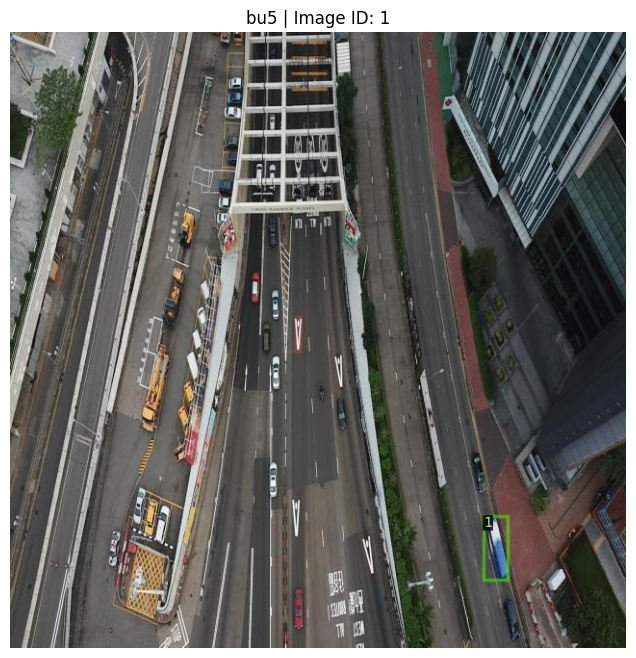

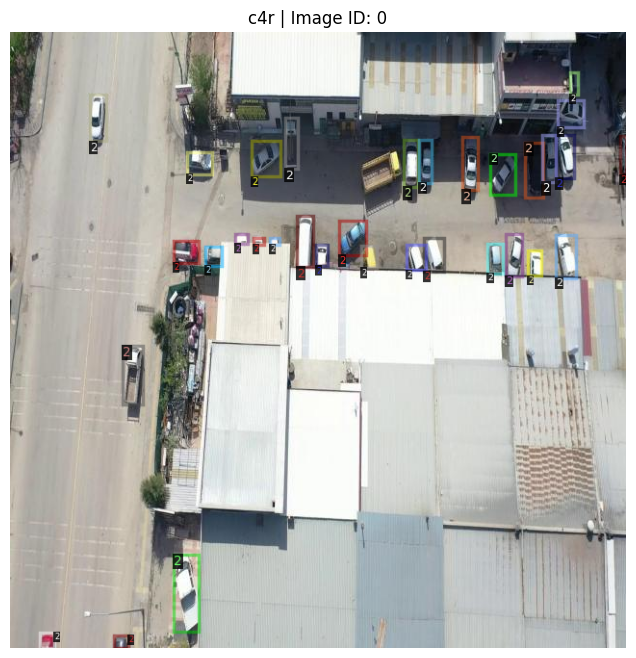

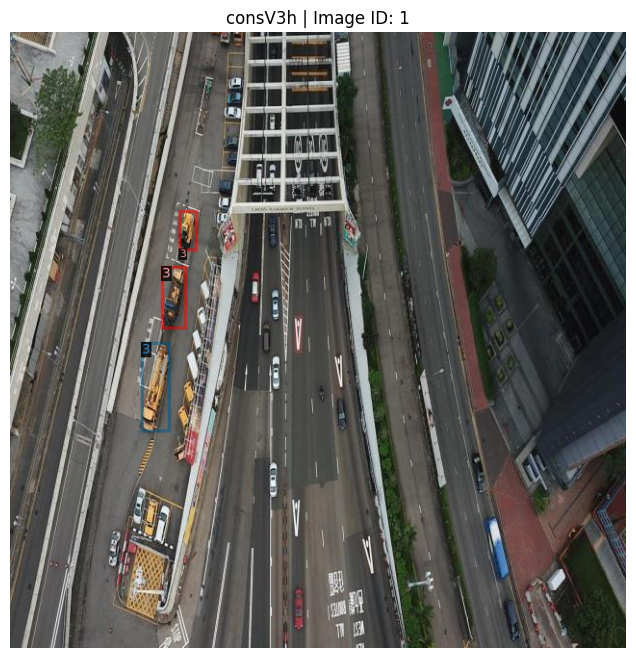

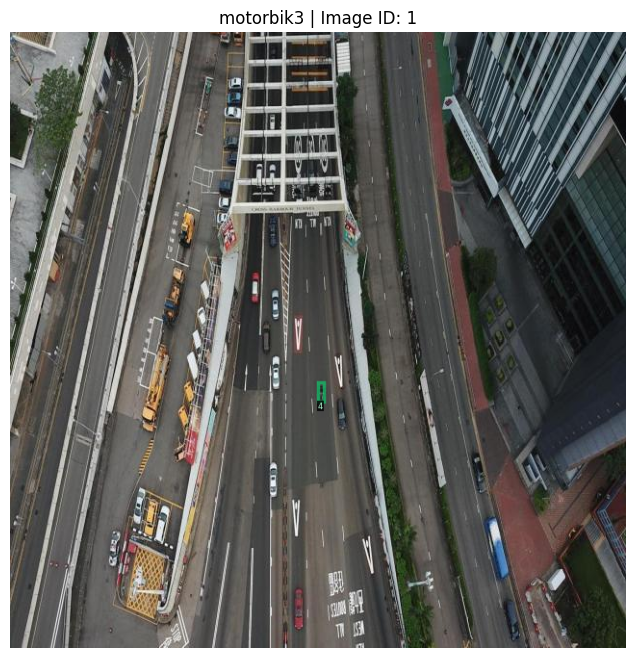

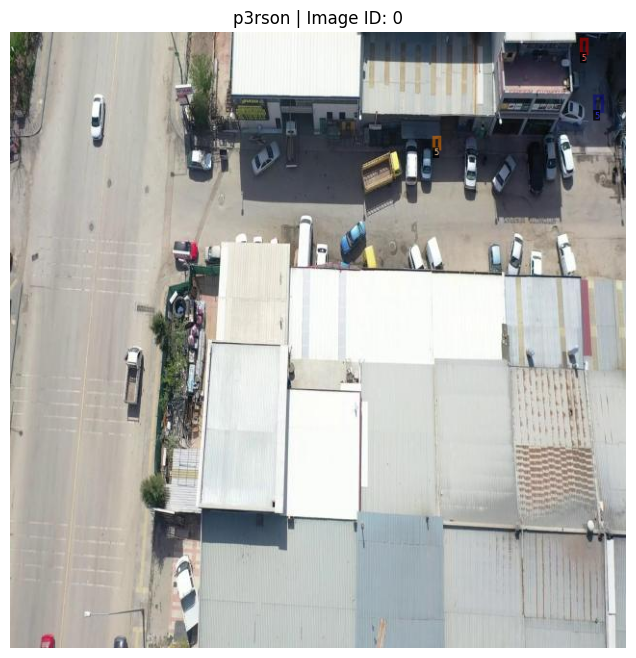

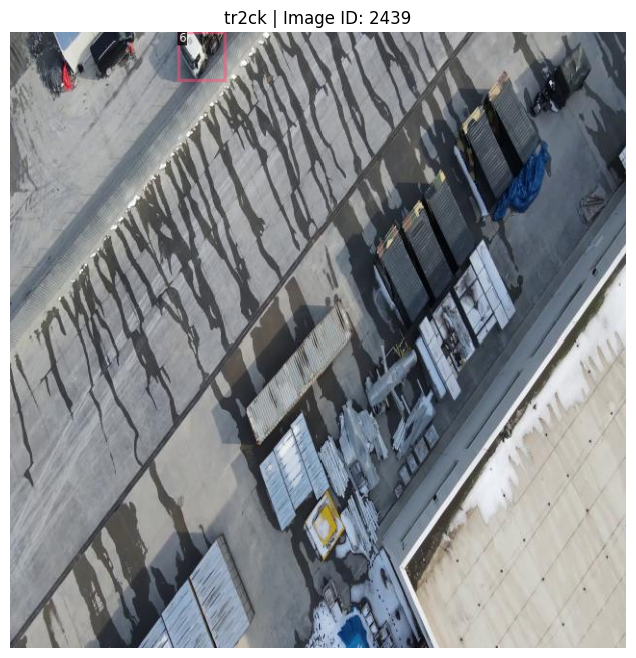

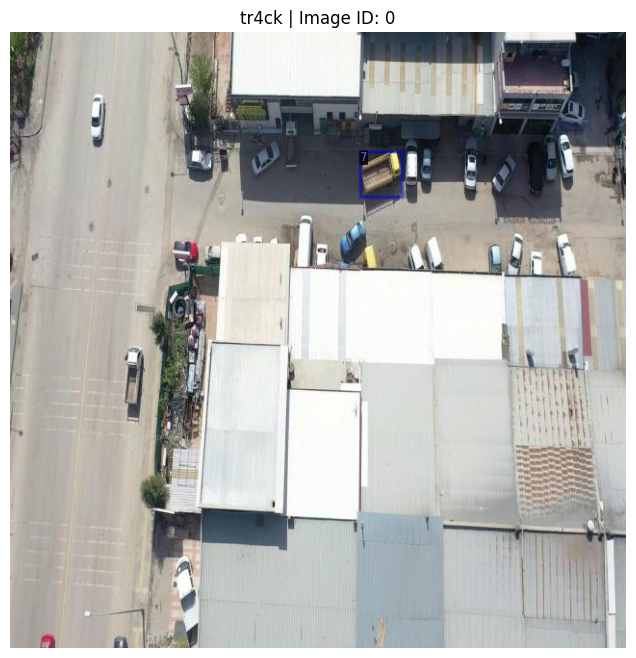

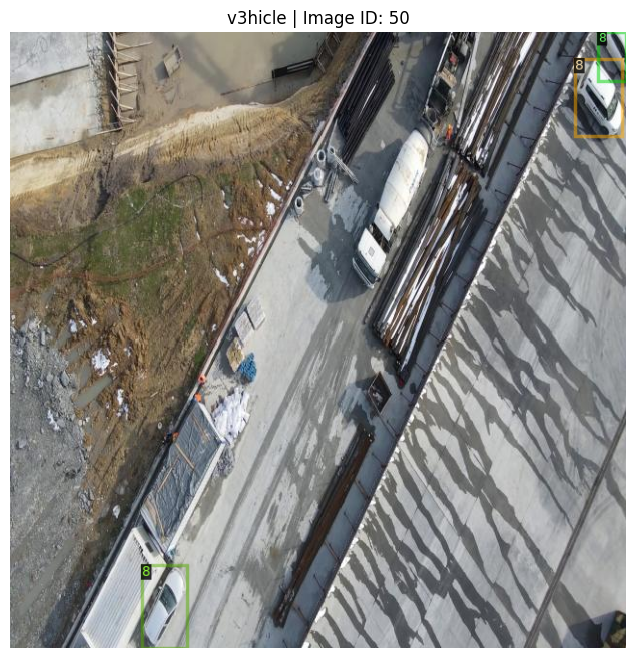

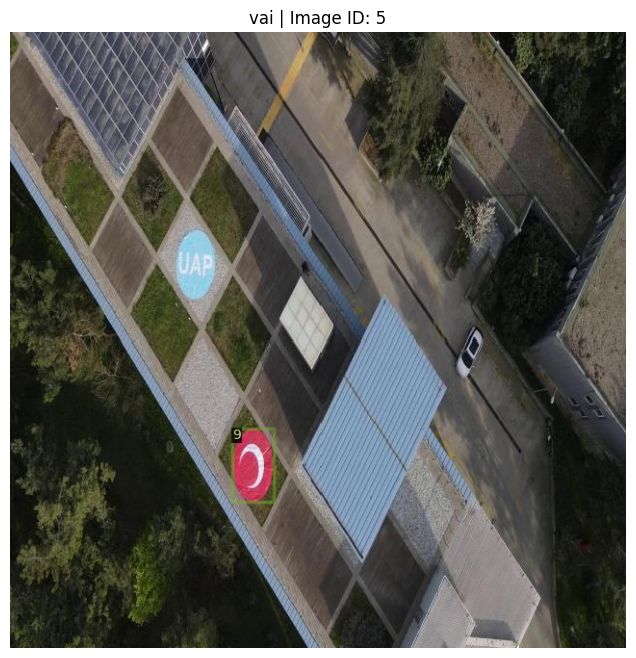

No annotations for category 'vai_false'
No annotations for category 'vai_true'


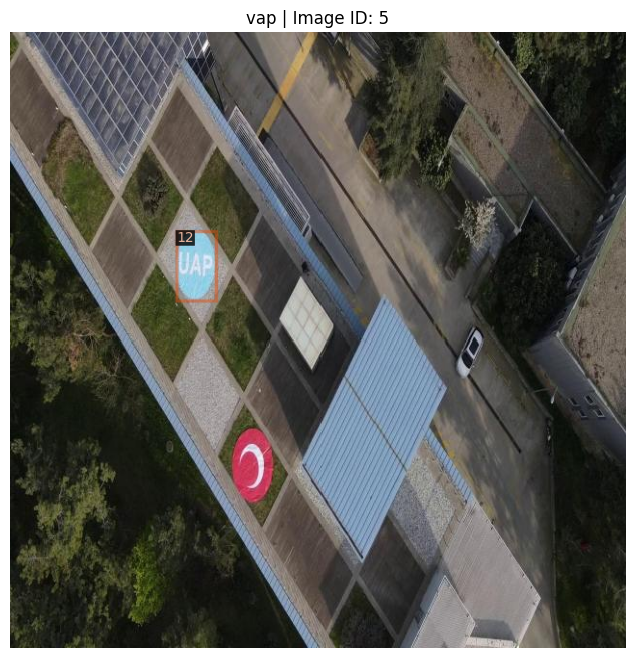

No annotations for category 'vap_false'
No annotations for category 'vap_true'


In [8]:
import matplotlib.pyplot as plt
import cv2
from detectron2.utils.visualizer import Visualizer
from detectron2.structures import BoxMode

def plot_n_images_per_category_only_its_annotations(coco, image_root, n=3):
    category_ids = coco.getCatIds()
    categories = coco.loadCats(category_ids)
    category_id_to_name = {cat['id']: cat['name'] for cat in categories}

    for cat_id in category_ids:
        cat_name = category_id_to_name[cat_id]
        ann_ids = coco.getAnnIds(catIds=[cat_id])
        if not ann_ids:
            print(f"No annotations for category '{cat_name}'")
            continue

        anns = coco.loadAnns(ann_ids)
        seen_img_ids = set()
        images_plotted = 0

        for ann in anns:
            img_id = ann["image_id"]
            if img_id in seen_img_ids:
                continue
            seen_img_ids.add(img_id)

            img_info = coco.loadImgs([img_id])[0]
            img_path = f"{image_root}/{img_info['file_name']}"
            image = cv2.imread(img_path)
            if image is None:
                print(f"⚠️ Could not load image: {img_path}")
                continue

            # Get only the annotations for this image and this category
            anns_for_image = coco.loadAnns(coco.getAnnIds(imgIds=[img_id], catIds=[cat_id]))
            for a in anns_for_image:
                a["bbox_mode"] = BoxMode.XYWH_ABS

            img_dict = {
                "file_name": img_path,
                "image_id": img_id,
                "height": image.shape[0],
                "width": image.shape[1],
                "annotations": anns_for_image
            }

            v = Visualizer(image[:, :, ::-1], scale=1.0)
            vis_output = v.draw_dataset_dict(img_dict)

            plt.figure(figsize=(8, 8))
            plt.imshow(vis_output.get_image())
            plt.axis("off")
            plt.title(f"{cat_name} | Image ID: {img_id}")
            plt.show()

            images_plotted += 1
            if images_plotted >= n:
                break

# change n for debugging, but we can't save it in github if many images are loaded
plot_n_images_per_category_only_its_annotations(train_coco, train_path, n=1)

## Transformar el dataset a sólo detección de vehiculos o personas

Todas las categorias son:
```
[
  'bu5', 'c4r', 'consV3h', 'motorbik3', 'p3rson', 'tr2ck', 'tr4ck', 'v3hicle',
  'vai', 'vai_false', 'vai_true', 'vap', 'vap_false', 'vap_true'
]
```

De las cuales, las categorias
```
'vai', 'vai_false', 'vai_true', 'vap', 'vap_false', 'vap_true'
```
pertenecen a simbolos en los edificios, lo cual no aportan a nuestro problema, por ende los ignoraremos.

Categorias filtradas:

```
  bu5 (ID 1): 849 instances
  c4r (ID 2): 41370 instances
  consV3h (ID 3): 367 instances. (Vehiculos de construccion)
  motorbik3 (ID 4): 6768 instances
  p3rson (ID 5): 26979 instances
  tr2ck (ID 6): 1 instances
  tr4ck (ID 7): 3095 instances
  v3hicle (ID 8): 734 instances  
```

In [9]:
from pycocotools.coco import COCO
import json


def filter_annotations(coco, output_path):
  # Category name mapping (correcting misspellings)
  vehicle_keywords = {"bu5", "c4r", "consV3h" ,"motorbik3", "tr2ck", "tr4ck", "v3hicle"}
  person_keywords = {"p3rson"}

  # Identify category IDs
  category_mapping = {cat["id"]: cat["name"] for cat in coco.loadCats(coco.getCatIds())}
  print(category_mapping)
  selected_category_ids = {id for id, name in category_mapping.items() if name in vehicle_keywords or name in person_keywords}
  print(selected_category_ids)

  # Standardized category IDs
  category_id_map = {id: 2 if name in vehicle_keywords else 1 for id, name in category_mapping.items() if id in selected_category_ids}

  print(f"Selected Category IDs: {category_id_map}")

  # Filter images and annotations
  filtered_annotations = []
  filtered_images = set()

  for ann in coco.dataset["annotations"]:
      if ann["category_id"] in category_id_map:
          new_ann = {**ann, "category_id": category_id_map[ann["category_id"]]}
          filtered_annotations.append(new_ann)
          filtered_images.add(ann["image_id"])


  # Keep only images that have valid annotations
  filtered_images = [img for img in coco.dataset["images"] if img["id"] in filtered_images]

  new_categories = [{"id": 1, "name": "person"}, {"id": 2, "name": "vehicle"}]

  for old_id, new_id in category_id_map.items():
    new_name = [cat_dict["name"] for cat_dict in new_categories if cat_dict["id"] == new_id][0]
    print(f"{category_mapping[old_id]} -> {new_name}")

  # Create new COCO dataset
  filtered_coco_data = {
      "images": filtered_images,
      "annotations": filtered_annotations,
      "categories": new_categories
  }

  # Save filtered dataset
  with open(output_path, "w", encoding="utf-8") as f:
      json.dump(filtered_coco_data, f, indent=4)

  print(f"Filtered dataset saved to {output_path}")

train_filtered_annotation_file = os.path.join(train_path, "_annotations_filtered.coco.json")
val_filtered_annotation_file = os.path.join(val_path, "_annotations_filtered.coco.json")

filter_annotations(train_coco, train_filtered_annotation_file)
filter_annotations(val_coco, val_filtered_annotation_file)

{0: 'People-cars', 1: 'bu5', 2: 'c4r', 3: 'consV3h', 4: 'motorbik3', 5: 'p3rson', 6: 'tr2ck', 7: 'tr4ck', 8: 'v3hicle', 9: 'vai', 10: 'vai_false', 11: 'vai_true', 12: 'vap', 13: 'vap_false', 14: 'vap_true'}
{1, 2, 3, 4, 5, 6, 7, 8}
Selected Category IDs: {1: 2, 2: 2, 3: 2, 4: 2, 5: 1, 6: 2, 7: 2, 8: 2}
bu5 -> vehicle
c4r -> vehicle
consV3h -> vehicle
motorbik3 -> vehicle
p3rson -> person
tr2ck -> vehicle
tr4ck -> vehicle
v3hicle -> vehicle
Filtered dataset saved to dataset/train/_annotations_filtered.coco.json
{0: 'People-cars', 1: 'bu5', 2: 'c4r', 3: 'consV3h', 4: 'motorbik3', 5: 'p3rson', 6: 'tr2ck', 7: 'tr4ck', 8: 'v3hicle', 9: 'vai', 10: 'vai_false', 11: 'vai_true', 12: 'vap', 13: 'vap_false', 14: 'vap_true'}
{1, 2, 3, 4, 5, 6, 7, 8}
Selected Category IDs: {1: 2, 2: 2, 3: 2, 4: 2, 5: 1, 6: 2, 7: 2, 8: 2}
bu5 -> vehicle
c4r -> vehicle
consV3h -> vehicle
motorbik3 -> vehicle
p3rson -> person
tr2ck -> vehicle
tr4ck -> vehicle
v3hicle -> vehicle
Filtered dataset saved to dataset/valid/

In [10]:
explore(COCO(train_filtered_annotation_file))

loading annotations into memory...
Done (t=0.89s)
creating index...
index created!
Categories: [
    {
        "id": 1,
        "name": "person"
    },
    {
        "id": 2,
        "name": "vehicle"
    }
]
Category names: ['person', 'vehicle']
Number of images: 5132
Annotations DataFrame head:
    id  image_id  category_id                  bbox     area segmentation  \
0   0         0            2  [83, 65, 16.5, 48.5]   800.25           []   
1   1         0            2  [184, 125, 25.5, 23]   586.50           []   
2   2         0            2  [251, 113, 30, 37.5]  1125.00           []   
3   3         0            2  [170, 217, 25.5, 23]   586.50           []   
4   4         0            2  [203, 223, 16.5, 20]   330.00           []   

   iscrowd  bbox_mode  
0        0        1.0  
1        0        1.0  
2        0        1.0  
3        0        1.0  
4        0        1.0  
Unique category IDs in annotations: {np.int64(1), np.int64(2)}

🔍 Category distribution:
  person (I

,id,image_id,category_id,bbox,area,segmentation,iscrowd,bbox_mode
0,0,0,2,"[83, 65, 16.5, 48.5]",800.25,[],0,1.0
1,1,0,2,"[184, 125, 25.5, 23]",586.50,[],0,1.0
2,2,0,2,"[251, 113, 30, 37.5]",1125.00,[],0,1.0
3,3,0,2,"[170, 217, 25.5, 23]",586.50,[],0,1.0
4,4,0,2,"[203, 223, 16.5, 20]",330.00,[],0,1.0
...,...,...,...,...,...,...,...,...
80158,81091,5174,2,"[238, 0, 26.5, 45.5]",1205.75,[],0,NaN
80159,81092,5174,2,"[135, 194, 35.5, 114]",4047.00,[],0,NaN
80160,81093,5174,2,"[217, 457, 30.5, 107.5]",3278.75,[],0,NaN
80161,81094,5174,1,"[496, 438, 13, 15.5]",201.50,[],0,NaN


loading annotations into memory...
Done (t=1.19s)
creating index...
index created!


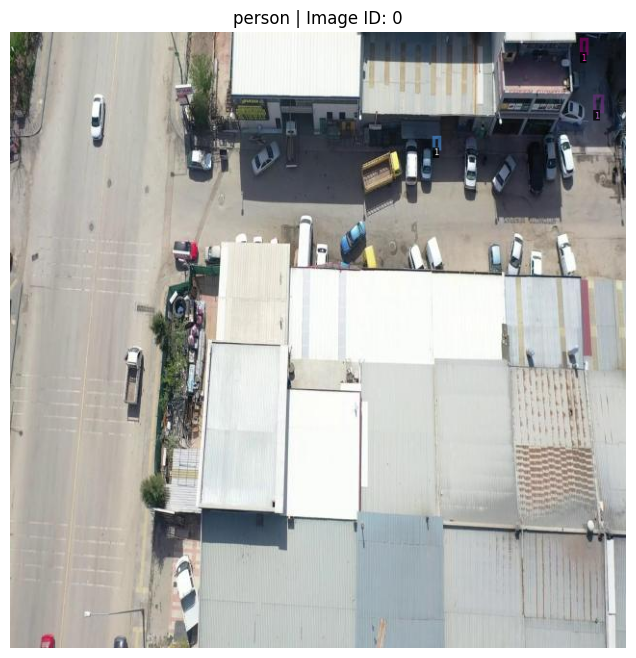

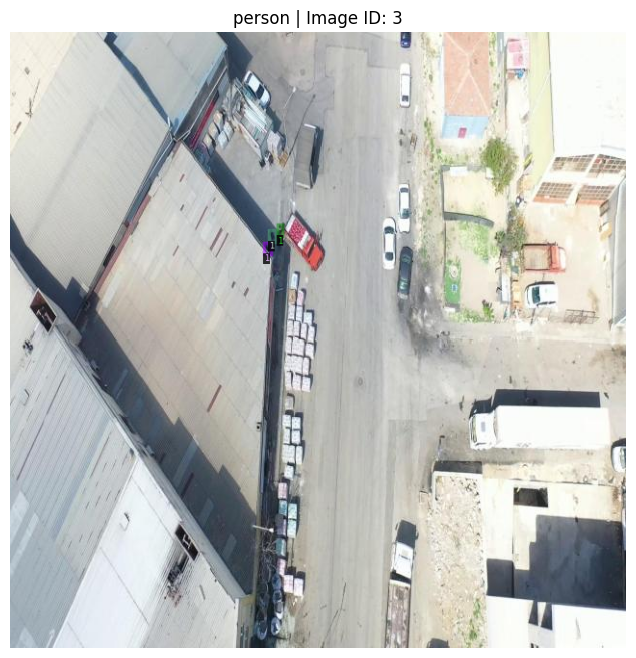

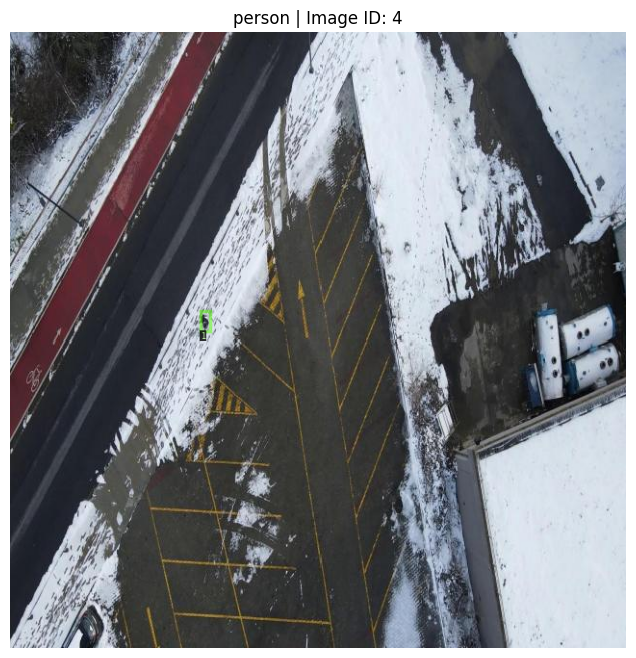

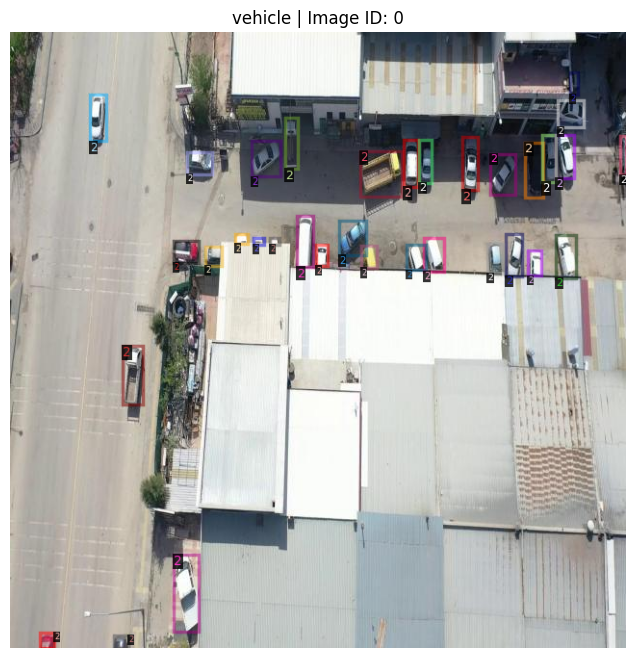

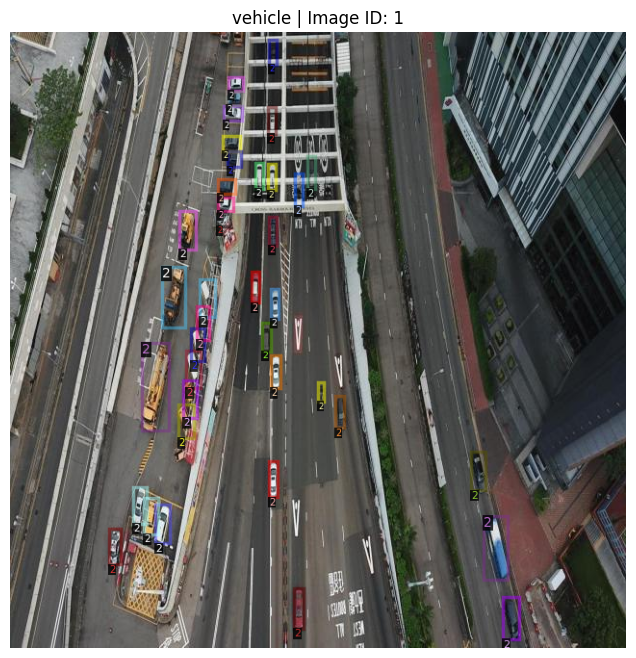

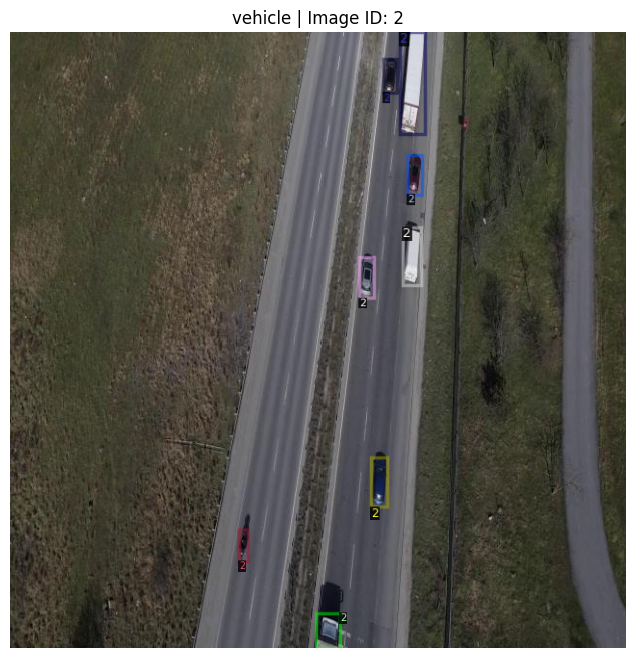

In [11]:
plot_n_images_per_category_only_its_annotations(COCO(train_filtered_annotation_file), train_path, n=3)

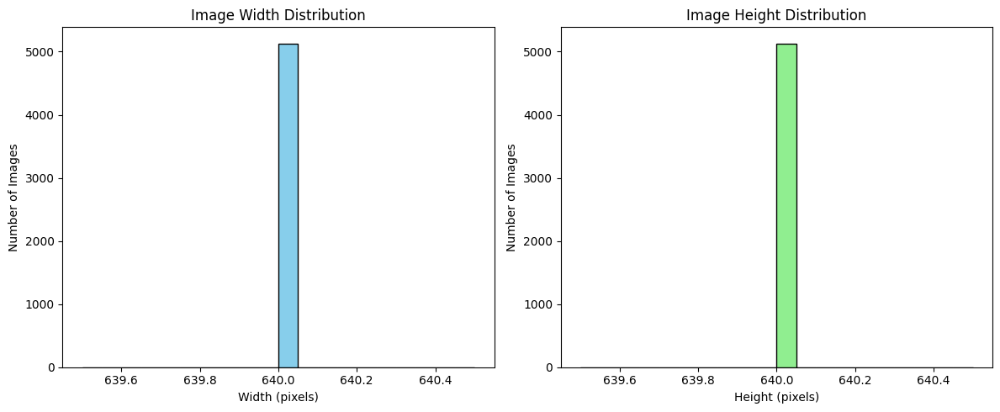

In [12]:
import json
import matplotlib.pyplot as plt

# Load the annotation JSON file
with open(train_filtered_annotation_file, 'r') as f:
    data = json.load(f)

# Extract width and height of all images
widths = [img['width'] for img in data['images']]
heights = [img['height'] for img in data['images']]

# Plot histograms
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(widths, bins=20, color='skyblue', edgecolor='black')
plt.title('Image Width Distribution')
plt.xlabel('Width (pixels)')
plt.ylabel('Number of Images')

plt.subplot(1, 2, 2)
plt.hist(heights, bins=20, color='lightgreen', edgecolor='black')
plt.title('Image Height Distribution')
plt.xlabel('Height (pixels)')
plt.ylabel('Number of Images')

plt.tight_layout()
plt.show()


[33.655177575689535, 66.34482242431046]


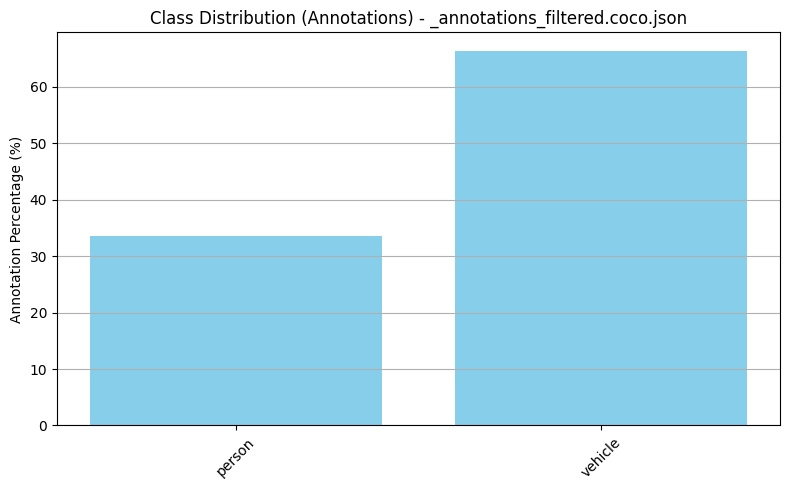

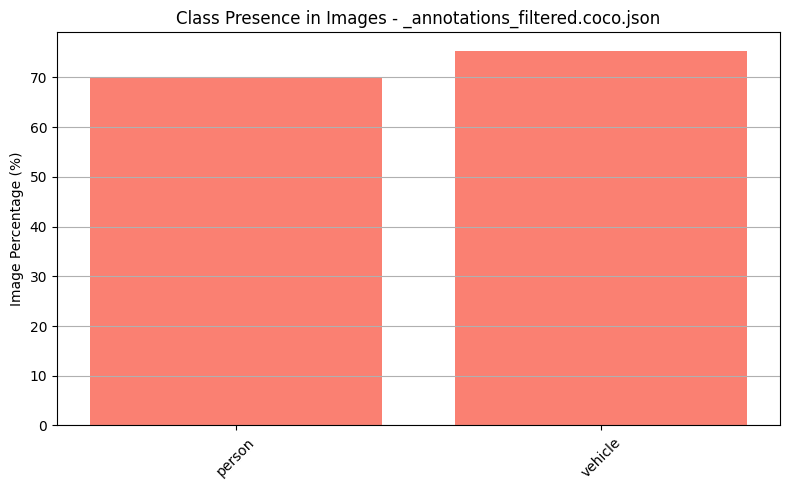

In [13]:
import json
from collections import defaultdict
import matplotlib.pyplot as plt
import os

def analyze_and_plot_coco_annotations(annotation_path, class_mapping=None):
    """
    Loads a COCO annotation file, computes class distribution as percentages, and plots them in two separate bar charts.

    Args:
        annotation_path (str): Path to the COCO-format JSON file.
        class_mapping (dict): Optional. Maps category_id to class name, e.g., {1: 'person', 2: 'vehicle'}
    """
    # Load the JSON
    with open(annotation_path, "r") as f:
        data = json.load(f)

    # Build category ID to name mapping if not provided
    if class_mapping is None:
        class_mapping = {cat["id"]: cat["name"] for cat in data["categories"]}

    # Initialize counters
    annotation_counts = defaultdict(int)
    image_class_map = defaultdict(set)

    for ann in data["annotations"]:
        cat_id = ann["category_id"]
        annotation_counts[cat_id] += 1
        image_class_map[ann["image_id"]].add(cat_id)

    image_counts = defaultdict(int)
    for class_ids in image_class_map.values():
        for cid in class_ids:
            image_counts[cid] += 1

    # Prepare data for plotting
    class_ids_sorted = sorted(class_mapping.keys())
    class_labels = [class_mapping[cid] for cid in class_ids_sorted]

    total_anns = sum(annotation_counts[cid] for cid in class_ids_sorted)
    total_imgs = len(image_class_map)

    ann_percentages = [
        100 * annotation_counts[cid] / total_anns if total_anns > 0 else 0
        for cid in class_ids_sorted
    ]
    img_percentages = [
        100 * image_counts[cid] / total_imgs if total_imgs > 0 else 0
        for cid in class_ids_sorted
    ]
    print(ann_percentages)

    # Plot 1: Annotation percentages
    plt.figure(figsize=(8, 5))
    plt.bar(class_labels, ann_percentages, color="skyblue")
    plt.ylabel("Annotation Percentage (%)")
    plt.title(f"Class Distribution (Annotations) - {os.path.basename(annotation_path)}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid(axis='y')
    plt.show()

    # Plot 2: Image percentages
    plt.figure(figsize=(8, 5))
    plt.bar(class_labels, img_percentages, color="salmon")
    plt.ylabel("Image Percentage (%)")
    plt.title(f"Class Presence in Images - {os.path.basename(annotation_path)}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid(axis='y')
    plt.show()


analyze_and_plot_coco_annotations(train_filtered_annotation_file)

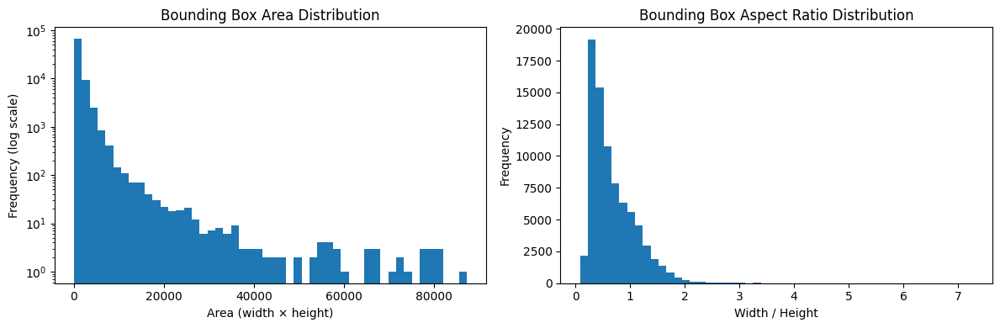

Total boxes: 80163
Small (<32²):  52963 (66.1%)
Medium (<96²): 26609 (33.2%)
Large (≥96²):  591 (0.7%)


In [14]:
import json
import matplotlib.pyplot as plt

def analyze_bbox_sizes(annotation_path):
    with open(annotation_path, 'r') as f:
        coco = json.load(f)

    areas = []
    aspect_ratios = []
    small, medium, large = 0, 0, 0

    for ann in coco["annotations"]:
        x, y, w, h = ann["bbox"]
        area = w * h
        if h > 0:
            aspect_ratio = w / h
            aspect_ratios.append(aspect_ratio)
        areas.append(area)

        # COCO size thresholds
        if area < 32**2:
            small += 1
        elif area < 96**2:
            medium += 1
        else:
            large += 1

    # Area distribution
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.hist(areas, bins=50, log=True)
    plt.title("Bounding Box Area Distribution")
    plt.xlabel("Area (width × height)")
    plt.ylabel("Frequency (log scale)")

    # Aspect ratio distribution
    plt.subplot(1, 2, 2)
    plt.hist(aspect_ratios, bins=50)
    plt.title("Bounding Box Aspect Ratio Distribution")
    plt.xlabel("Width / Height")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

    # Print size category breakdown
    total = small + medium + large
    print(f"Total boxes: {total}")
    print(f"Small (<32²):  {small} ({small/total:.1%})")
    print(f"Medium (<96²): {medium} ({medium/total:.1%})")
    print(f"Large (≥96²):  {large} ({large/total:.1%})")

analyze_bbox_sizes(train_filtered_annotation_file)


In [15]:
[el for el in os.listdir(train_path) if not el.endswith(".jpg")]

['_annotations_filtered.coco.json', '_annotations.coco.json']

In [16]:
import json
from collections import defaultdict

# Load the filtered COCO annotations
with open("dataset/train/_annotations_filtered.coco.json", "r") as f:
    coco = json.load(f)

# Image IDs grouped by category
category_to_image_ids = defaultdict(set)

for ann in coco["annotations"]:
    category_id = ann["category_id"]
    image_id = ann["image_id"]
    category_to_image_ids[category_id].add(image_id)

# Count how many unique images have person and vehicle detections
person_images = category_to_image_ids[1]
vehicle_images = category_to_image_ids[2]

# Print stats
print(f"Images with 'person': {len(person_images)}")
print(f"Images with 'vehicle': {len(vehicle_images)}")
print(f"Images with both: {len(person_images & vehicle_images)}")
print(f"Images with either: {len(person_images | vehicle_images)}")


Images with 'person': 3592
Images with 'vehicle': 3865
Images with both: 2325
Images with either: 5132


In [17]:
import torch
print(torch.__version__, torch.version.cuda)

2.6.0+cu124 12.4


In [18]:
import detectron2
print(detectron2.__version__)  # Example output: 0.6

0.6


In [19]:
!pip list | grep -E "torch|detectron2|cuda"

cuda-python                           12.6.2.post1
cupy-cuda12x                          13.3.0
dask-cuda                             25.2.0
detectron2                            0.6
jax-cuda12-pjrt                       0.5.1
jax-cuda12-plugin                     0.5.1
numba-cuda                            0.2.0
nvidia-cuda-cupti-cu12                12.4.127
nvidia-cuda-nvcc-cu12                 12.5.82
nvidia-cuda-nvrtc-cu12                12.4.127
nvidia-cuda-runtime-cu12              12.4.127
torch                                 2.6.0+cu124
torchaudio                            2.6.0+cu124
torchsummary                          1.5.1
torchvision                           0.21.0+cu124


In [20]:
import torch
import detectron2
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
import os


In [21]:
import json

with open(train_filtered_annotation_file, "r") as f:
    data = json.load(f)

print("Number of images:", len(data.get("images", [])))
print("Number of annotations:", len(data.get("annotations", [])))


Number of images: 5132
Number of annotations: 80163


In [22]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# # Function to unregister a dataset
def unregister_dataset(dataset_name):
    if dataset_name in DatasetCatalog.list():
        DatasetCatalog.remove(dataset_name)
        MetadataCatalog.pop(dataset_name, None)  # Remove metadata as well

train_dataset_name = "train_filtered"
val_dataset_name = "val_filtered"

# # Unregister if already registered
unregister_dataset(train_dataset_name)
unregister_dataset(val_dataset_name)

# Now re-register safely
register_coco_instances(
    train_dataset_name,
    {},
    train_filtered_annotation_file,
    train_path
)

register_coco_instances(
    val_dataset_name,
    {},
    val_filtered_annotation_file,
    val_path
)


# Load metadata and dataset
metadata = MetadataCatalog.get(train_dataset_name)
dataset_dicts = DatasetCatalog.get(train_dataset_name)
# with open('dataset_dicts.json', 'w') as f:
#     json.dump(dataset_dicts, f, indent=4)

# Verify dataset is loaded correctly
print(f"Loaded {len(dataset_dicts)} images.")


Loaded 5132 images.


## Val subset (Debugging)

```python
# Load the full validation dataset
val_dataset_dicts = DatasetCatalog.get(val_dataset_name)

# Create a subset with the first 250 images
val_subset_dicts = val_dataset_dicts[:250]

# Optional: Check how many are in the subset
print(f"Validation subset contains {len(val_subset_dicts)} images.")

val_subset_name = "val_subset_250"

# Unregister if already exists
unregister_dataset(val_subset_name)

# Register subset using a lambda so it's only sliced once
DatasetCatalog.register(val_subset_name, lambda: val_dataset_dicts[:250])
MetadataCatalog.get(val_subset_name).set(thing_classes=metadata.thing_classes)

# Load to verify
subset_loaded = DatasetCatalog.get(val_subset_name)
print(f"Subset registered with {len(subset_loaded)} images.")

```

In [23]:
from collections import defaultdict
from detectron2.data import DatasetCatalog, MetadataCatalog

def count_images_per_category(dataset_name):
    dataset_dicts = DatasetCatalog.get(dataset_name)
    category_to_images = defaultdict(set)

    for item in dataset_dicts:
        image_id = item["image_id"]  # Unique image identifier
        for annotation in item["annotations"]:
            category_id = annotation["category_id"]
            category_to_images[category_id].add(image_id)

    # Convert set sizes to counts
    category_counts = {category_id: len(images) for category_id, images in category_to_images.items()}

    # Map category IDs to names
    metadata = MetadataCatalog.get(dataset_name)
    id_to_name = {i: name for i, name in enumerate(metadata.thing_classes)} if hasattr(metadata, "thing_classes") else {}

    # Print results
    print(f"Dataset: {dataset_name}")
    for category_id, count in category_counts.items():
        category_name = id_to_name.get(category_id, f"Category {category_id}")
        print(f"  {category_name}: {count} images")

# Count images per category for train and validation datasets
count_images_per_category(train_dataset_name)
count_images_per_category(val_dataset_name)


Dataset: train_filtered
  vehicle: 3865 images
  person: 3592 images
Dataset: val_filtered
  person: 1072 images
  vehicle: 251 images


In [24]:
import os

repo_path = '/content/computer-vision-2'
if not os.path.exists(repo_path):
  print('Repo not downloaded yet.')
  !git clone https://{github_pat}@github.com/jmestanza/computer-vision-2.git
else:
  print('Repo available.')

Repo not downloaded yet.
Cloning into 'computer-vision-2'...
remote: Enumerating objects: 543, done.
remote: Counting objects: 100% (81/81), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 543 (delta 73), reused 54 (delta 54), pack-reused 462 (from 1)
Receiving objects: 100% (543/543), 643.44 MiB | 25.10 MiB/s, done.
Resolving deltas: 100% (245/245), done.


In [25]:
import datetime
import uuid

if not os.path.exists(f'{repo_path}/runs'):
    os.makedirs(f'{repo_path}/runs')
    print('Directory created.')
else:
    print('Directory already exists.')

run_id = str(uuid.uuid4())
print("run_id: ", run_id)
run_id_folder = f"run_id_{run_id}"

if not os.path.exists(f'{repo_path}/runs/{run_id_folder}'):
    os.makedirs(f'{repo_path}/runs/{run_id_folder}')
    print('Directory created.')
else:
    print('Directory already exists.')

Directory already exists.
run_id:  2b164ce3-5afc-4cb6-bd30-c814c0b80b21
Directory created.


In [26]:
from detectron2.evaluation import COCOEvaluator
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.modeling.roi_heads import FastRCNNOutputLayers
from detectron2.layers import ShapeSpec
from detectron2.modeling.box_regression import Box2BoxTransform
from detectron2.config import get_cfg
import os
import torch
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.engine import DefaultTrainer, HookBase
from detectron2.utils.events import get_event_storage
from detectron2.data import detection_utils as utils
from detectron2.data import transforms as T
from detectron2.model_zoo import get_checkpoint_url
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
import datetime
from detectron2.data import build_detection_train_loader
from detectron2.data import build_detection_train_loader, DatasetMapper
from detectron2.data import transforms as T

import torch.nn.functional as F
from detectron2.modeling.roi_heads.fast_rcnn import FastRCNNOutputLayers

from detectron2.engine.hooks import HookBase

class BestCheckpointerHook(HookBase):
    def __init__(self, eval_period, output_dir, model):
        super().__init__()
        self.eval_period = eval_period
        self.output_dir = output_dir
        self.model = model
        self.best_ap_person = -1
        self.best_ap_vehicle = -1

    def after_step(self):
        storage = get_event_storage()
        current_iter = storage.iter

        # Check if this step is an evaluation step
        if (current_iter + 1) % self.eval_period == 0:
            # Retrieve latest evaluation metrics
            metrics = storage.latest()
            print(f"Iteration {current_iter + 1} - Available evaluation metric keys:", list(metrics.keys()))

            # Extract AP values for person and vehicle
            ap_person_tuple = metrics.get("bbox/AP-person")
            ap_vehicle_tuple = metrics.get("bbox/AP-vehicle")

            # If the model does not predict anything on the validation set,
            # it won't be able to perform metrics (it means it hasn't iterated enough)

            if ap_person_tuple is None:
                print("Warning: Could not get bbox/AP-person in evaluation metrics.")
            else:
                ap_person, _ = ap_person_tuple
                print("ap_person:", ap_person)
                if ap_person > self.best_ap_person:
                    self.best_ap_person = ap_person
                    self.trainer.checkpointer.save(f"model_best_person_{run_id}")

            if ap_vehicle_tuple is None:
                print("Warning: Could not get bbox/AP-vehicle in evaluation metrics.")
            else:
                ap_vehicle, _ = ap_vehicle_tuple
                print("ap_vehicle:", ap_vehicle)
                if ap_vehicle > self.best_ap_vehicle:
                    self.best_ap_vehicle = ap_vehicle
                    self.trainer.checkpointer.save(f"model_best_vehicle_{run_id}")


class FastRCNNFocalLossOutputLayers(FastRCNNOutputLayers):
    def __init__(self, *args, alpha=0.25, gamma=2.0, **kwargs):
        super().__init__(*args, **kwargs)
        self.alpha = alpha
        self.gamma = gamma

    def focal_loss(self, inputs, targets):
        """
        Focal loss for multi-class classification
        inputs: [N, C], raw logits
        targets: [N], int64 class indices
        """
        ce_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        return focal_loss.mean()

    def losses(self, predictions, proposals):
        scores, proposal_deltas = predictions
        gt_classes = (
            cat([p.gt_classes for p in proposals], dim=0)
            if len(proposals)
            else torch.empty(0, dtype=torch.int64, device=scores.device)
        )
        _log_classification_stats(scores, gt_classes)

        # Focal Loss instead of standard CE
        loss_cls = self.focal_loss(scores, gt_classes)

        proposal_boxes = cat([p.proposal_boxes.tensor for p in proposals], dim=0)
        gt_boxes = cat([p.gt_boxes.tensor for p in proposals], dim=0)
        loss_box_reg = self.box_reg_loss(
            proposal_deltas,
            proposal_boxes,
            gt_boxes,
            gt_classes,
        )

        return {
            "loss_cls": loss_cls,
            "loss_box_reg": loss_box_reg,
        }

from detectron2.modeling.roi_heads.fast_rcnn import FastRCNNOutputLayers, _log_classification_stats
from detectron2.layers import cat

class FastRCNNWeightedLossOutputLayers(FastRCNNOutputLayers):
    def __init__(self, *args, class_weights=None, **kwargs):
        super().__init__(*args, **kwargs)
        if class_weights is None:
            # You can tweak these as needed
            class_weights = torch.tensor([1.86, 1.0])  # [person, vehicle]
        self.class_weights = class_weights

    def losses(self, predictions, proposals):
        scores, proposal_deltas = predictions
        gt_classes = (
            cat([p.gt_classes for p in proposals], dim=0)
            if len(proposals)
            else torch.empty(0, dtype=torch.int64, device=scores.device)
        )
        _log_classification_stats(scores, gt_classes)

        # Apply weighted CE
        weights = self.class_weights.to(scores.device)
        loss_cls = F.cross_entropy(scores, gt_classes, weight=weights)

        proposal_boxes = cat([p.proposal_boxes.tensor for p in proposals], dim=0)
        gt_boxes = cat([p.gt_boxes.tensor for p in proposals], dim=0)
        loss_box_reg = self.box_reg_loss(
            proposal_deltas,
            proposal_boxes,
            gt_boxes,
            gt_classes,
        )

        return {
            "loss_cls": loss_cls,
            "loss_box_reg": loss_box_reg,
        }


backbone = "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(backbone))

cfg.MODEL.WEIGHTS = get_checkpoint_url(backbone)

max_iters = 10000
eval_period = int(0.10*max_iters)

cfg.DATASETS.TRAIN = (train_dataset_name,)
cfg.DATASETS.TEST = (val_dataset_name,)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2


cfg.SOLVER.CHECKPOINT_PERIOD = eval_period
cfg.TEST.EVAL_PERIOD = eval_period
cfg.MODEL.DEVICE = "cuda"

cfg.INPUT.MIN_SIZE_TRAIN = (640,)
cfg.INPUT.MAX_SIZE_TRAIN = 640
cfg.INPUT.MIN_SIZE_TEST = 640
cfg.INPUT.MAX_SIZE_TEST = 640

# cfg.INPUT.MIN_SIZE_TRAIN = (512,)  # Or even (512,)
# cfg.INPUT.MAX_SIZE_TRAIN = 1024
cfg.SOLVER.BASE_LR = 0.00025
# Automatic Mixed Precision (AMP) - speed up training
cfg.SOLVER.AMP.ENABLED = True
cfg.SOLVER.MAX_ITER = max_iters
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # Your dataset classes
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5



cfg.OUTPUT_DIR = "./output"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name):
        return COCOEvaluator(dataset_name, output_dir=cfg.OUTPUT_DIR)

    @classmethod
    def build_train_loader(cls, cfg):
        # Define a list of augmentation transforms
        aug_list = [
            T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
            T.RandomBrightness(0.8, 1.2),
            T.RandomContrast(0.8, 1.2),
            T.RandomSaturation(0.8, 1.2),
            # You can also add:
            T.RandomRotation(angle=[-10, 10]),
            T.RandomCrop("relative_range", (0.8, 0.8)),
        ]
        # DatasetMapper handles reading the dataset dicts, applying transforms,
        # and preparing "gt_boxes", "gt_classes", etc.
        mapper = DatasetMapper(cfg, is_train=True, augmentations=aug_list)
        return build_detection_train_loader(cfg, mapper=mapper)

    def build_hooks(self):
        # Include default hooks
        hooks = super().build_hooks()
        # Append custom hook for saving best models
        hooks.append(
            BestCheckpointerHook(
                self.cfg.TEST.EVAL_PERIOD,
                self.cfg.OUTPUT_DIR,
                self.model
            )
        )
        return hooks


# Initialize model
trainer = MyTrainer(cfg)
model = trainer.build_model(cfg)  # Get model

# Remove existing predictor **BEFORE** loading weights
input_shape = model.roi_heads.box_predictor.cls_score.weight.shape[1]
box2box_transform = Box2BoxTransform(weights=(10.0, 10.0, 5.0, 5.0))

# model.roi_heads.box_predictor = FastRCNNOutputLayers(
#     input_shape=ShapeSpec(channels=input_shape),
#     num_classes=cfg.MODEL.ROI_HEADS.NUM_CLASSES,
#     box2box_transform=box2box_transform,
#     test_score_thresh=cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST,
#     test_nms_thresh=cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST
# )

model.roi_heads.box_predictor = FastRCNNFocalLossOutputLayers(
    input_shape=ShapeSpec(channels=input_shape),
    num_classes=cfg.MODEL.ROI_HEADS.NUM_CLASSES,
    box2box_transform=box2box_transform,
    test_score_thresh=cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST,
    test_nms_thresh=cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST,
    alpha=0.25,
    gamma=2.0,
)

# # para tratar de contrarestrar el desbalance de las anotaciones
# model.roi_heads.box_predictor = FastRCNNWeightedLossOutputLayers(
#     input_shape=ShapeSpec(channels=input_shape),
#     num_classes=cfg.MODEL.ROI_HEADS.NUM_CLASSES,
#     box2box_transform=box2box_transform,
#     test_score_thresh=cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST,
#     test_nms_thresh=cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST,
#     # person, vehicle [33.655177575689535, 66.34482242431046]
#     # 66.34482242431046/33.655177575689535 =  1.97131101968
#     class_weights=torch.tensor([1.97131101968, 1.0])  # You can adjust these
# )



# Load only the backbone & FPN weights, skipping the head
checkpointer = DetectionCheckpointer(model)
checkpointer.load(cfg.MODEL.WEIGHTS)

# Start training
trainer.resume_or_load(resume=False)
trainer.train()

# detectron automatically saves the weights in ./output/model_final.pth

[04/20 21:43:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:08, 52.1MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[04/20 21:43:38 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x/139173657/model_final_68b088.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[04/20 21:43:38 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:227: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


[04/20 21:43:49 d2.utils.events]:  eta: 0:57:29  iter: 19  total_loss: 3.392  loss_cls: 1.052  loss_box_reg: 0.4178  loss_rpn_cls: 1.738  loss_rpn_loc: 0.2442    time: 0.3629  last_time: 0.2964  data_time: 0.0225  last_data_time: 0.0049   lr: 4.9953e-06  max_mem: 3114M
[04/20 21:44:03 d2.utils.events]:  eta: 0:54:11  iter: 39  total_loss: 3.314  loss_cls: 0.9915  loss_box_reg: 0.426  loss_rpn_cls: 1.485  loss_rpn_loc: 0.2994    time: 0.3411  last_time: 0.2915  data_time: 0.0066  last_data_time: 0.0049   lr: 9.9902e-06  max_mem: 3582M
[04/20 21:44:10 d2.utils.events]:  eta: 0:53:29  iter: 59  total_loss: 1.887  loss_cls: 0.896  loss_box_reg: 0.4311  loss_rpn_cls: 0.3002  loss_rpn_loc: 0.211    time: 0.3348  last_time: 0.2873  data_time: 0.0083  last_data_time: 0.0120   lr: 1.4985e-05  max_mem: 3582M
[04/20 21:44:16 d2.utils.events]:  eta: 0:51:46  iter: 79  total_loss: 1.56  loss_cls: 0.7541  loss_box_reg: 0.3659  loss_rpn_cls: 0.1438  loss_rpn_loc: 0.1961    time: 0.3274  last_time: 0.

In [28]:
# metrics are under output folder
!cp -r output/ {repo_path}/runs/{run_id_folder}
# delete pth as it weights too much (300Mb)
!rm -rf {repo_path}/runs/{run_id_folder}/output/*.pth

with open(f'{repo_path}/runs/{run_id_folder}/cfg-{run_id}.yaml', "w") as f:
    f.write(cfg.dump())

In [29]:
start_path = os.getcwd()
print(start_path)
os.chdir(repo_path)
print(os.getcwd())
!git config --global user.email "jmestanza@gmail.com"
!git config --global user.name "jmestanza"
!git config pull.rebase false
!git pull
!git add .
# !git commit -m "uploading run {run_id}"
os.system(f'git commit -m "uploading run {run_id}"')
!git push origin main
os.chdir(start_path)

/content
/content/computer-vision-2
remote: Enumerating objects: 5, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 3 (delta 1), reused 0 (delta 0), pack-reused 0 (from 0)
Unpacking objects: 100% (3/3), 8.68 MiB | 8.77 MiB/s, done.
From https://github.com/jmestanza/computer-vision-2
   6ae3643..50463ab  main       -> origin/main
Updating 6ae3643..50463ab
Fast-forward
 tp_vpc2_that_worked_9e476a55.ipynb | 483 ++++++++++++-------------------------
 1 file changed, 148 insertions(+), 335 deletions(-)
Enumerating objects: 12, done.
Counting objects: 100% (12/12), done.
Delta compression using up to 2 threads
Compressing objects: 100% (9/9), done.
Writing objects: 100% (10/10), 505.22 KiB | 4.47 MiB/s, done.
Total 10 (delta 2), reused 1 (delta 0), pack-reused 0
remote: Resolving deltas: 100% (2/2), completed with 2 local objects.
To https://github.com/jmestanza/computer-vision-2.git
   50463ab..fe6cbb8  main -> main


[04/20 23:08:47 d2.data.datasets.coco]: Loaded 5132 images in COCO format from dataset/train/_annotations_filtered.coco.json


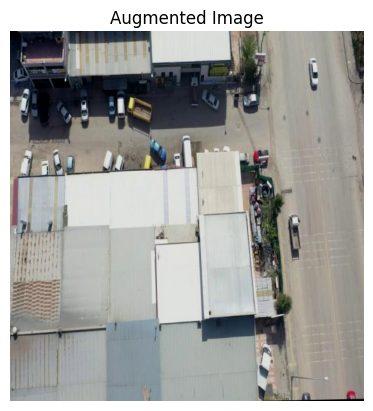

In [30]:
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.transforms import AugInput
import matplotlib.pyplot as plt
import cv2
from detectron2.data import transforms as T
import detectron2.data.detection_utils as utils

augmentations = [
    T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
    T.RandomBrightness(0.8, 1.2),
    T.RandomContrast(0.8, 1.2),
    T.RandomSaturation(0.8, 1.2),
    # You can also add:
    T.RandomRotation(angle=[-10, 10]),
    T.RandomCrop("relative_range", (0.8, 0.8)),
]

dataset_dicts = DatasetCatalog.get(train_dataset_name)
metadata = MetadataCatalog.get(train_dataset_name)
sample = dataset_dicts[0]
image = utils.read_image(sample["file_name"], format="BGR")
auginput = AugInput(image)
transform = T.AugmentationList(augmentations)(auginput)
aug_image = auginput.image

plt.imshow(cv2.cvtColor(aug_image, cv2.COLOR_BGR2RGB))
plt.title("Augmented Image")
plt.axis("off")
plt.show()


[04/20 23:08:49 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


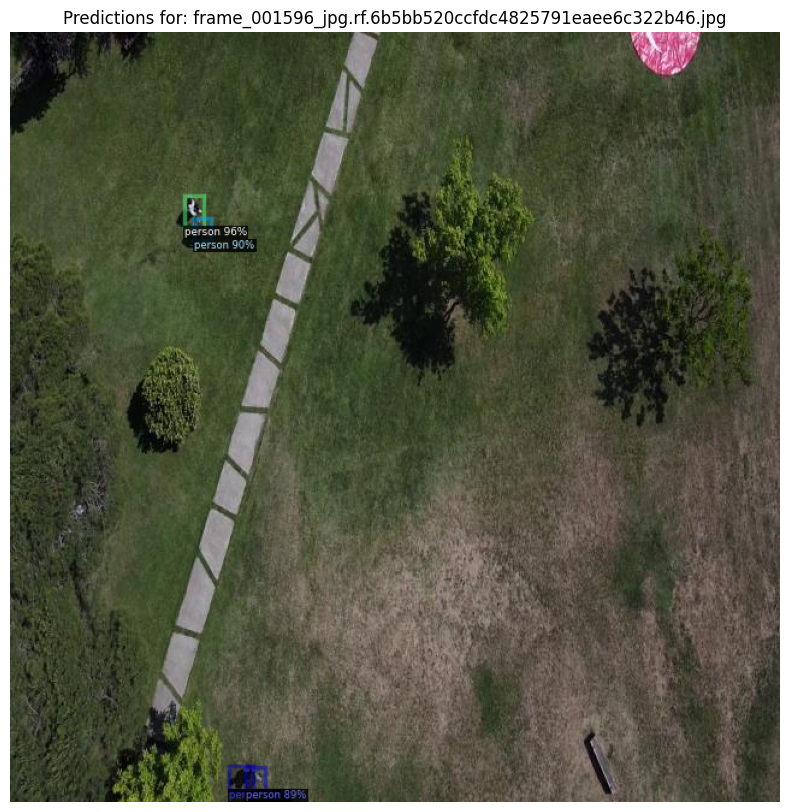

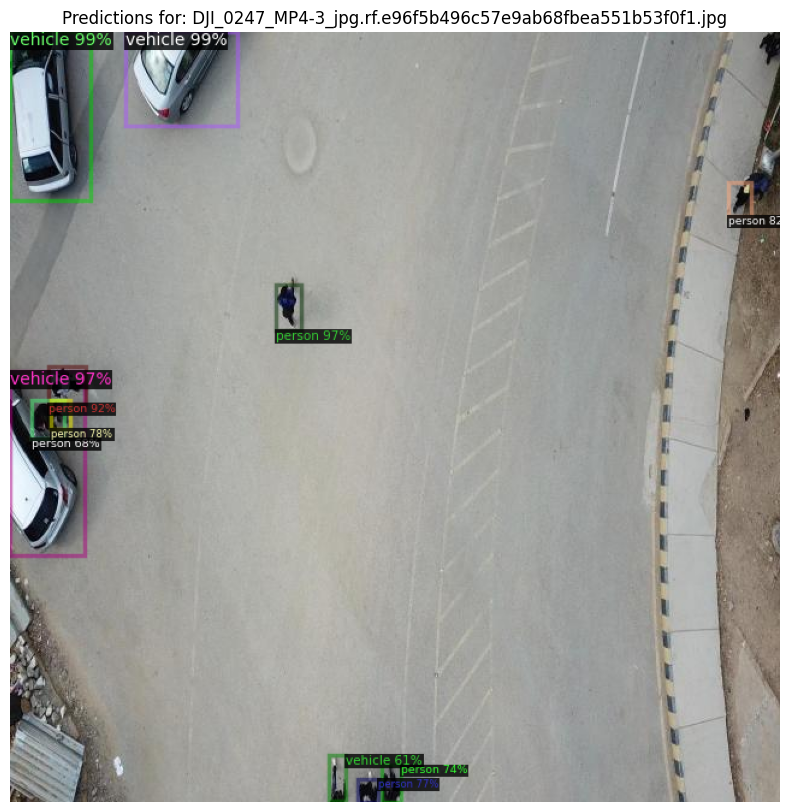

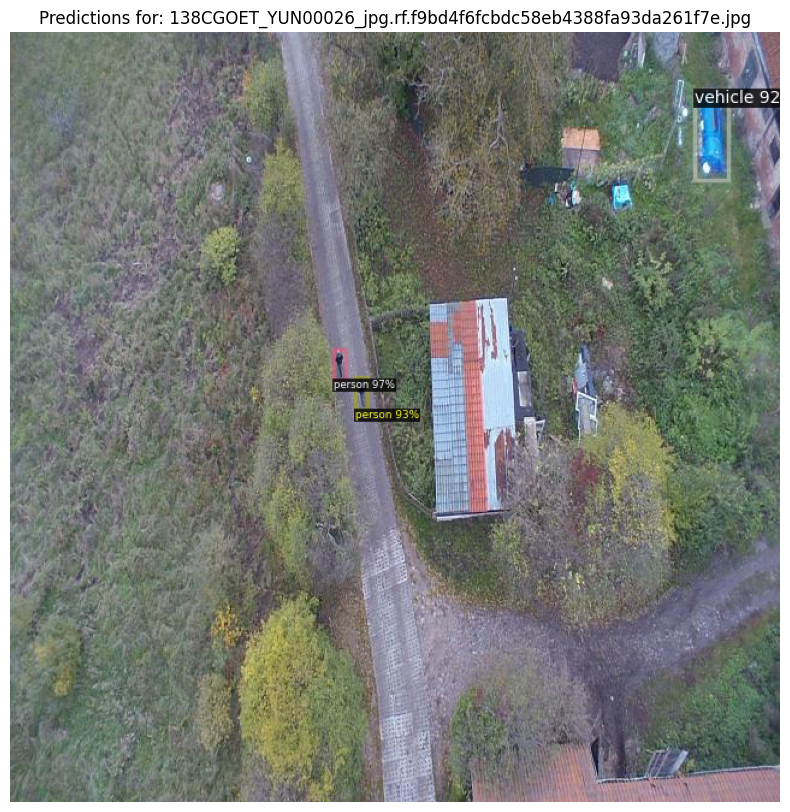

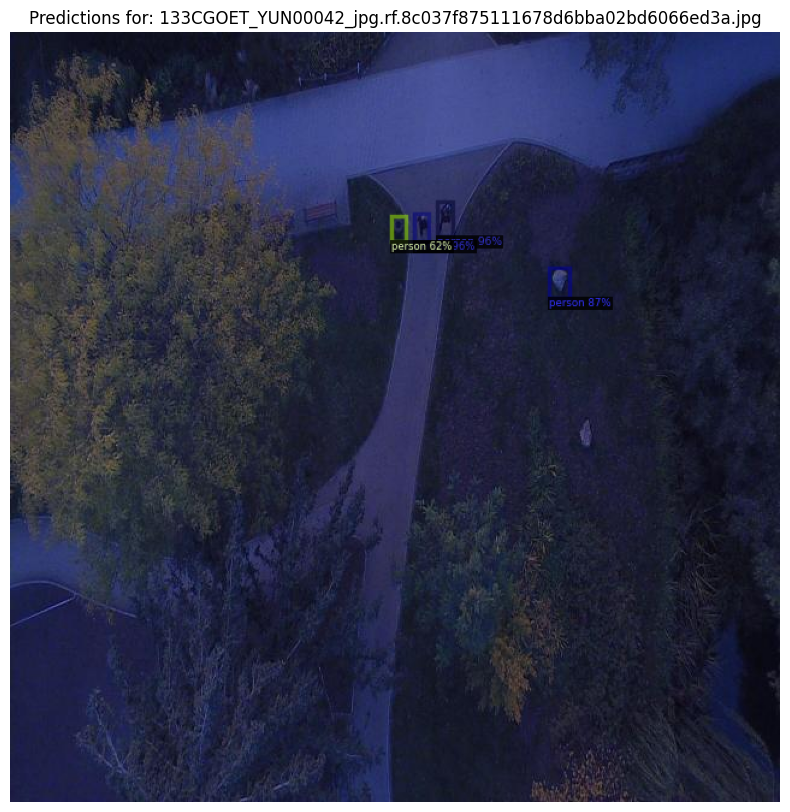

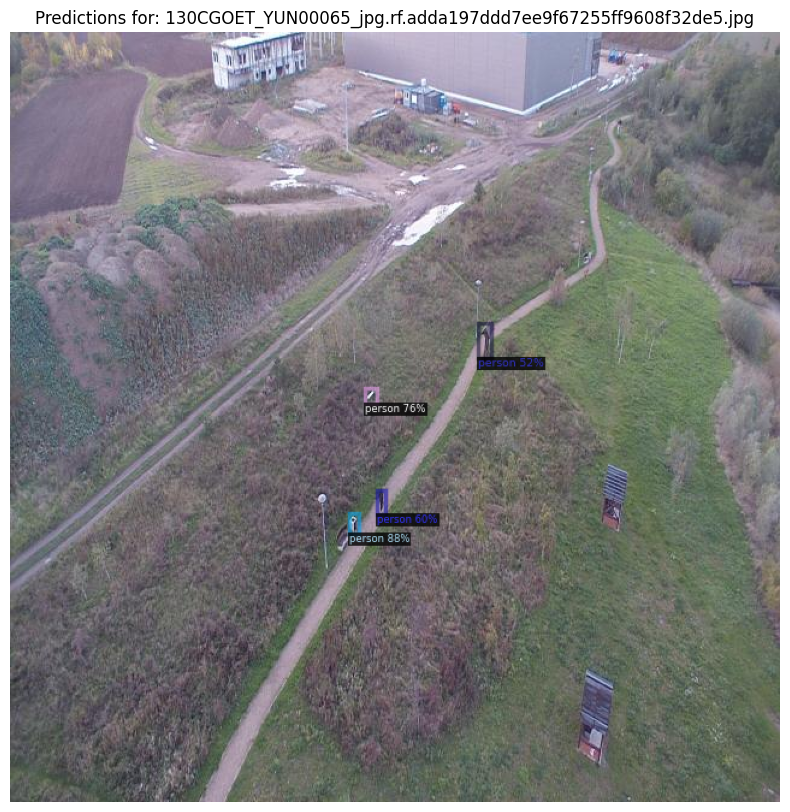

In [31]:
import random
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
import matplotlib.pyplot as plt
import cv2
import os

def predict_n_random_images(n=5):
  # Initialize predictor

  # Point to your trained model
  cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, f"model_final.pth")
  # cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_0024999.pth")

  # Recreate the predictor after setting weights
  predictor = DefaultPredictor(cfg)

  # Get metadata
  metadata = MetadataCatalog.get(val_dataset_name)

  # Shuffle images
  val_images = sorted(os.listdir(val_path))
  random.shuffle(val_images)

  # Show n random predictions
  num_to_show = n
  for i, fname in enumerate(val_images[:num_to_show]):
      image_path = os.path.join(val_path, fname)
      image = cv2.imread(image_path)

      outputs = predictor(image)
      instances = outputs["instances"].to("cpu")

      v = Visualizer(image[:, :, ::-1], metadata=metadata, scale=1.0)
      out = v.draw_instance_predictions(instances)

      plt.figure(figsize=(10, 10))
      plt.imshow(out.get_image())
      plt.title(f"Predictions for: {fname}")
      plt.axis("off")
      plt.show()

predict_n_random_images(5)

## Descargo pesos automáticamente

In [32]:
print(eval_period)

1000


In [33]:
weights = [el for el in os.listdir('output') if el.startswith('model') and el.endswith('.pth')]
print(weights)
# download 5 last weights

['model_0006999.pth', 'model_0008999.pth', 'model_0007999.pth', 'model_0003999.pth', 'model_0004999.pth', 'model_0000999.pth', 'model_0009999.pth', 'model_0001999.pth', 'model_best_person_2b164ce3-5afc-4cb6-bd30-c814c0b80b21.pth', 'model_0002999.pth', 'model_final.pth', 'model_best_vehicle_2b164ce3-5afc-4cb6-bd30-c814c0b80b21.pth', 'model_0005999.pth']


In [ ]:
from google.colab import files
# save best models
output_dir = cfg.OUTPUT_DIR

best_model_person = f"model_best_person_{run_id}.pth"
best_model_vehicle = f"model_best_vehicle_{run_id}.pth"
files.download(f"{output_dir}/{best_model_person}")
files.download(f"{output_dir}/{best_model_vehicle}")

In [34]:
# save last
new_filename = f"model_final_{run_id}.pth"
shutil.copy(f"{output_dir}/model_final.pth", f"{output_dir}/{new_filename}")
files.download(f"{output_dir}/{new_filename}")

TypeError: download() got multiple values for argument 'filename'

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir output

In [ ]:
%tensorboard --logdir {repo_path}/runs